In [ ]:
from google.colab import files
uploaded = files.upload()

Saving uch001a.jpg to uch001a.jpg
Saving uch001b.jpg to uch001b.jpg
Saving uch010a.jpg to uch010a.jpg
Saving uch010b.jpg to uch010b.jpg
Saving uch020a.jpg to uch020a.jpg
Saving uch020b.jpg to uch020b.jpg
Saving uch098a.jpg to uch098a.jpg
Saving uch098b.jpg to uch098b.jpg


In [ ]:
ls

sample_data/  uch001b.jpg  uch010b.jpg  uch020b.jpg  uch098b.jpg
uch001a.jpg   uch010a.jpg  uch020a.jpg  uch098a.jpg


In [ ]:
!pip install ipython-autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 8.5 MB/s 


In [ ]:
%load_ext autotime

time: 519 µs (started: 2022-09-22 16:32:41 +00:00)


In [ ]:
!pip install -U opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 4.43 s (started: 2022-09-22 16:32:41 +00:00)


## Parte 1: Cálculo de puntos de interés Harris

In [ ]:
%load_ext Cython

time: 856 ms (started: 2022-09-22 16:32:45 +00:00)


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef np.ndarray[np.float32_t, ndim=2] gradx(np.ndarray[np.float32_t, ndim=2] input):
  cdef np.ndarray[np.float32_t, ndim=2] output=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)

  cdef int i, j # indices para recorrer la imagen de entrada

  for i in range(input.shape[0]): # se recorren todas las filas
    for j in range(1, input.shape[1] - 1): # se evitan los bordes para calzar con la aproximación [-1, 0, 1]
      output[i,j] = (input[i,j+1] - input[i,j-1]) # se aplica la convolución

  return output

time: 1.57 s (started: 2022-09-22 16:32:46 +00:00)


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef np.ndarray[np.float32_t, ndim=2] grady(np.ndarray[np.float32_t, ndim=2] input):
  cdef np.ndarray[np.float32_t, ndim=2] output=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)

  cdef int i, j # indices para recorrer la imagen de entrada

  for i in range(1, input.shape[0] - 1): # se evitan los bordes para calzar con la aproximación [-1, 0, 1]^T
    for j in range(input.shape[1]): # se recorren todas las columnas
      output[i,j] = (input[i+1,j] - input[i-1,j]) # se aplica la convolución
  return output

time: 1.14 s (started: 2022-09-22 16:32:48 +00:00)


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef np.ndarray[np.float32_t, ndim=2] product(np.ndarray[np.float32_t, ndim=2] input1, np.ndarray[np.float32_t, ndim=2] input2):
  
  cdef np.ndarray[np.float32_t, ndim=2] output=np.zeros([input1.shape[0], input1.shape[1]], dtype = np.float32)

  cdef int i,j # indices para recorrer las imágenes, se asume que tienen los mismos tamaños

  for i in range(input1.shape[0]):
    for j in range(input1.shape[1]):
      output[i,j] = input1[i,j] * input2[i,j] # Multiplicación pixel a pixel

  return output

time: 1.01 s (started: 2022-09-22 16:32:49 +00:00)


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef np.ndarray[np.float32_t, ndim=2] harris(np.ndarray[np.float32_t, ndim=2] mxx, np.ndarray[np.float32_t, ndim=2] mxy, np.ndarray[np.float32_t, ndim=2] myy):

  cdef np.ndarray[np.float32_t, ndim=2] output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef int i, j # indices para recorrer las matrices mxx, mxy y myy.
  cdef float det, tr # valores flotantes para guardar el valor det y tr para construir el cornerness de harris
  
  # se comienza iniciando los valores definidos en 0
  det = 0
  tr = 0
  for i in range(mxx.shape[0]):
    for j in range(mxx.shape[1]):
      det = mxx[i,j] * myy[i,j] - (mxy[i,j] ** 2) # se calcula la variable det
      tr = mxx[i,j] + myy[i,j] # se calcula la variable tr

      output[i,j] = det - 0.04 * (tr ** 2) # se guarda el valor obtenido a partir de la combinación entre det, tr y un factor (0.04)

  return output

time: 935 ms (started: 2022-09-22 16:32:50 +00:00)


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef np.ndarray[np.float32_t, ndim=2] getMaxima(np.ndarray[np.float32_t, ndim=2] h, float val):

  # Luego, hacer 1 los valores en los cuales se cumplen dos condiciones:
  #   h[r,c] es un maximo local respecto a sus 8 vecinos
  #   h[r,c] supera el valor val
  cdef np.ndarray[np.float32_t, ndim=2] output=np.zeros([h.shape[0], h.shape[1]], dtype = np.float32)
  cdef int i, j, m, n # i, j recorrerán la matriz, mientras que m y n permiten recorrer bloques de 3x3 dentro de esta.

  cdef float max, ij # se definen dos valores flotantes para facilitar la lectura

  for i in range(1, h.shape[0] - 1):
    for j in range(1, h.shape[1] - 1): # se recorre la imagen de entrada 
      ij = h[i,j] # se guarda momentáneamente el valor en el cual estamos (posición i,j)
      max = 0 # se define un maximo
      for m in [-1, 0, 1]:
        for n in [-1, 0, 1]: # se recorren bloques de 3x3 (8 vecinos del valor actual i,j)
          if h[i+m, j+n] >= ij: # si es mayor o igual al valor actual se guarda en la variable max
            max = h[i+m, j+n]
      if (max == ij) and (ij > val): # si el valor actual cumple ambas condiciones se cambia el 0 en la posición i,j por un 1.
        output[i,j] = 1

  return output

time: 1.25 s (started: 2022-09-22 16:32:51 +00:00)


In [ ]:
# Esta funcion genera keypoints a partir de una imagen de entrada
# La imagen de entrada es la salida del filtro de Harris
# No es necesario modificar esta funcion
def getKeyPoints(input):
  output = []
  input_rows = input.shape[0]
  input_cols = input.shape[1]
  for r in range(input_rows):
    for c in range(input_cols):
      if input[r,c] > 0:
        kp = cv2.KeyPoint()
        kp.pt = (c,r)
        kp.size = 10
        kp.angle = 0
        output.append(kp)
  return output

time: 2.52 ms (started: 2022-09-22 16:32:52 +00:00)


In [ ]:
import cv2
def harrisDetector(input, val):
  input = np.float32( input )
  # 1) Suavizar la imagen de entrada con cv.GaussianBlur( )
  Blur_img = cv2.GaussianBlur(input, (5,5),2)
  # 2) Calcular gradientes imx e imy (usando funciones de cython gradx y grady definidas arriba)
  imx = gradx(Blur_img)
  imy = grady(Blur_img)
  # 3) Calcular momentos usando la funcion product( )
  #    imxx = imx*imx (pixel a pixel)
  #    imxy = imx*imy (pixel a pixel)
  #    imyy = imy*imy (pixel a pixel)
  imxx = product(imx, imx)
  imxy = product(imx, imy)
  imyy = product(imy, imy)
  # 4) Suavizar momentos imxx, imxy, imyy con cv.GaussianBlur( )
  mxx = cv2.GaussianBlur(imxx, (7,7), 1.2)
  mxy = cv2.GaussianBlur(imxy, (7,7), 1.2)
  myy = cv2.GaussianBlur(imyy, (7,7), 1.2)
  # 5) Aplicar el filtro de Harris (usando funcion de Cython harris definida arriba)
  post_harris = harris(mxx, mxy, myy)
  # 6) Encontrar puntos maximos usando getMaxima( )
  max_points = getMaxima(post_harris, val)
  # 7) Generar el listado de puntos usando getKeyPoints( )
  points = getKeyPoints(max_points)
  return points, post_harris

time: 534 ms (started: 2022-09-22 16:32:52 +00:00)


In [ ]:
def do_rotate(img, angle):
  h = img.shape[0]
  w = img.shape[1]
  cx = w // 2
  cy = h // 2
  m = cv2.getRotationMatrix2D((cx, cy), -angle, 1.0)
  cosa = np.cos(angle * np.pi / 180.0)
  sina = np.sin(angle * np.pi / 180.0)
  nw = int((h * sina) + (w * cosa))
  nh = int((h * cosa) + (w * sina))
  m[0,2] += (nw / 2) - cx
  m[1,2] += (nh / 2) - cy
  return cv2.warpAffine(img, m, (nw, nh))

time: 3.36 ms (started: 2022-09-22 16:32:53 +00:00)


Resultados de filtro de Harris


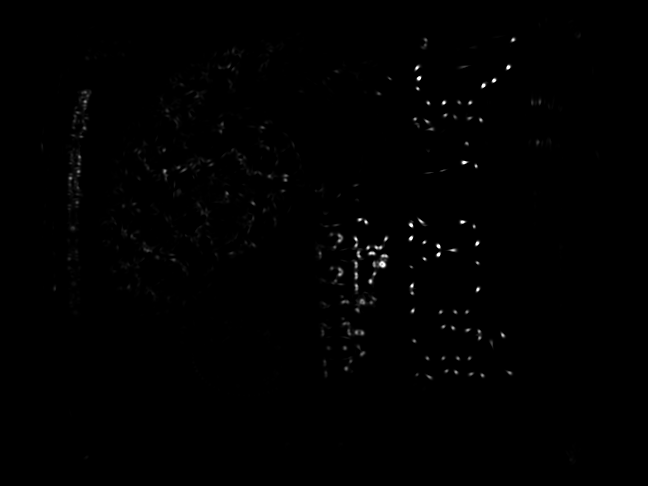

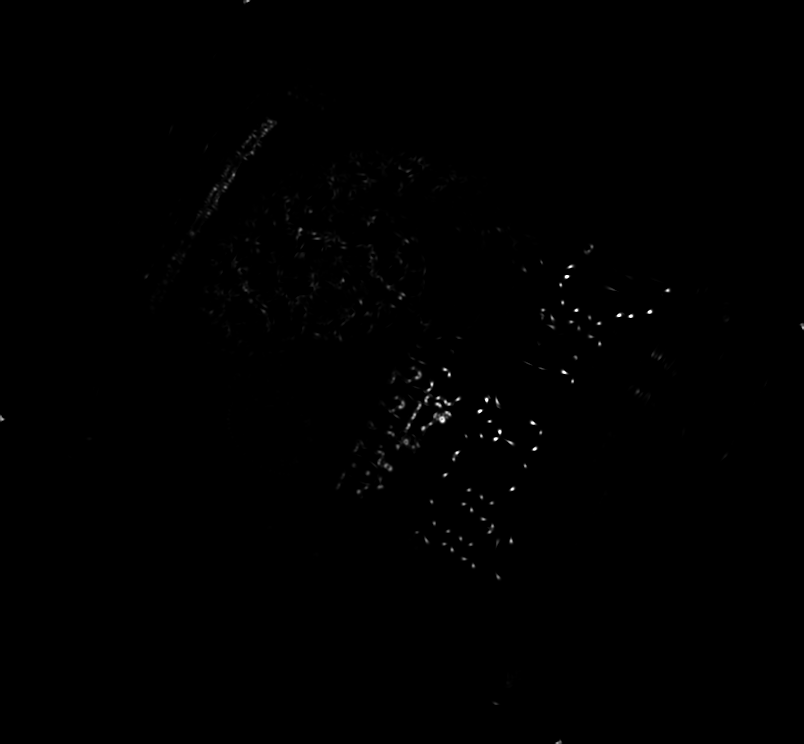

Puntos de interes


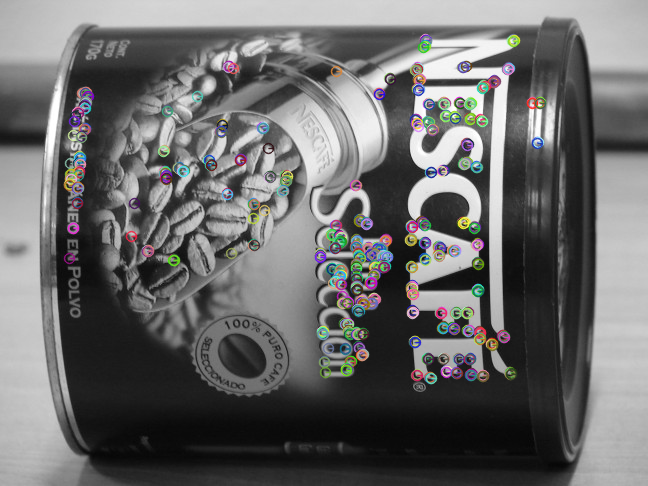

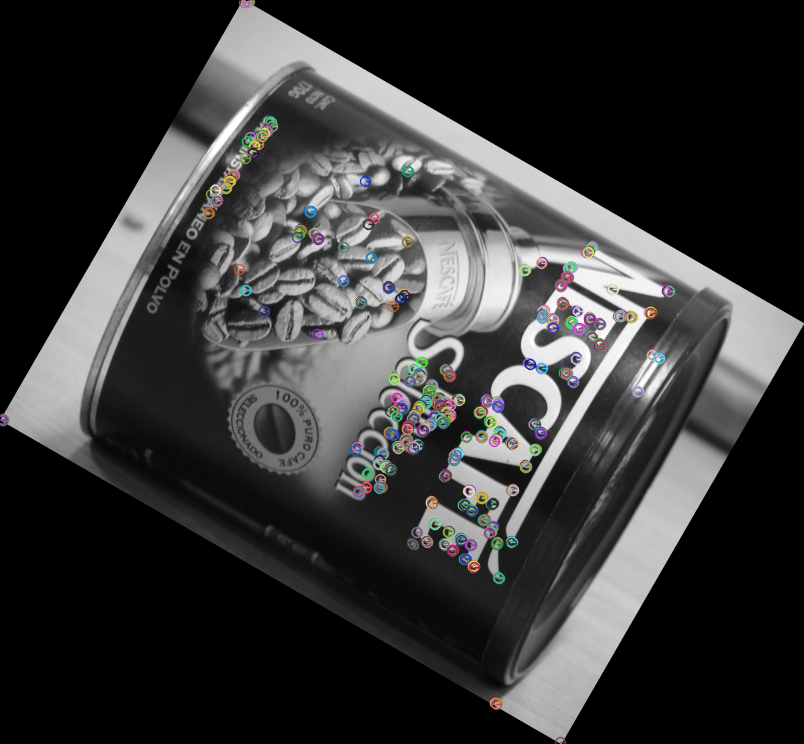

time: 4.56 s (started: 2022-09-22 16:32:53 +00:00)


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

img1 = cv2.imread('uch010a.jpg',0)
img2 = do_rotate(img1, 30)

kp1, h1 = harrisDetector(img1, 3e5)
kp2, h2 = harrisDetector(img2, 3e5)

res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print('Resultados de filtro de Harris')
cv2_imshow(h1 * 500 / np.max(np.max(h1)))
cv2_imshow(h2 * 500 / np.max(np.max(h2)))
print('Puntos de interes')
cv2_imshow(res1)
cv2_imshow(res2)

Resultados de filtro de Harris


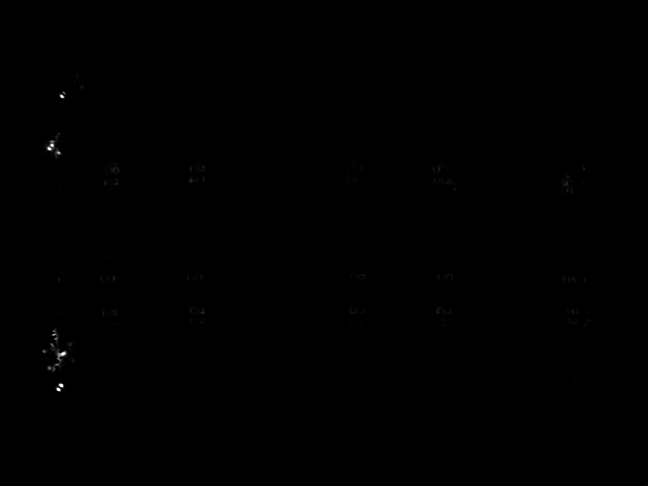

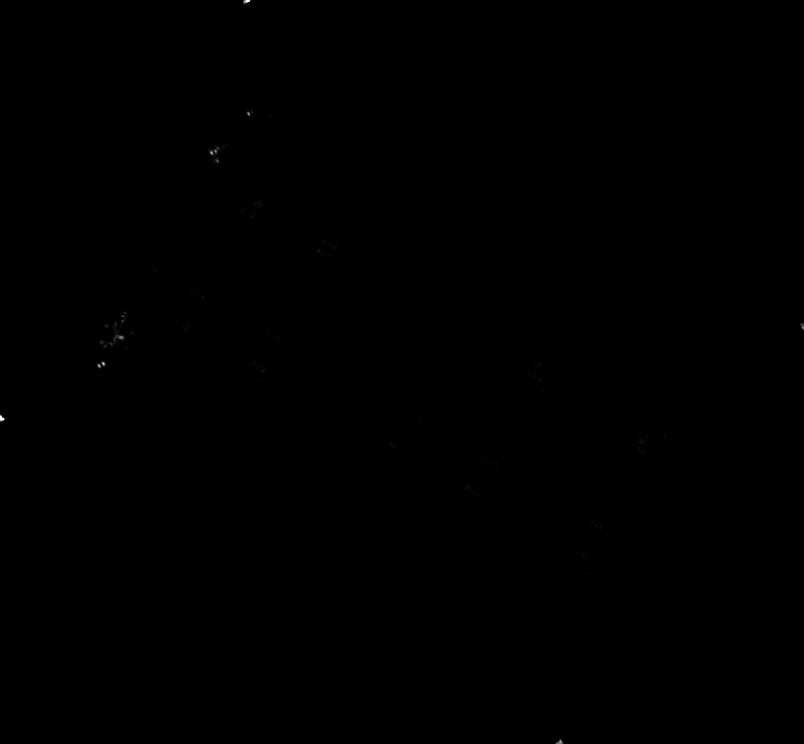

Puntos de interes


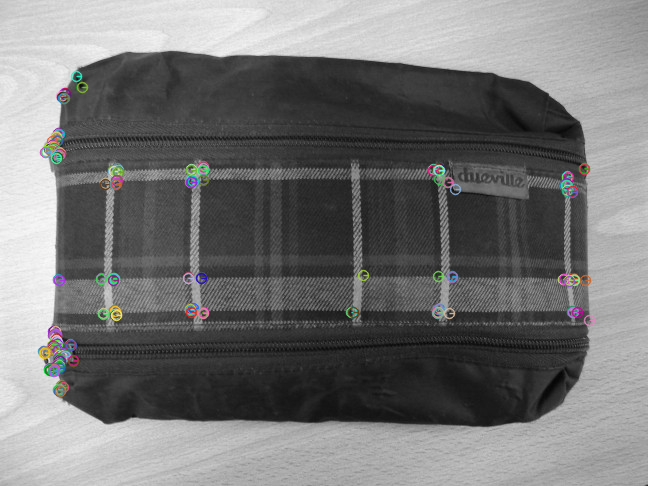

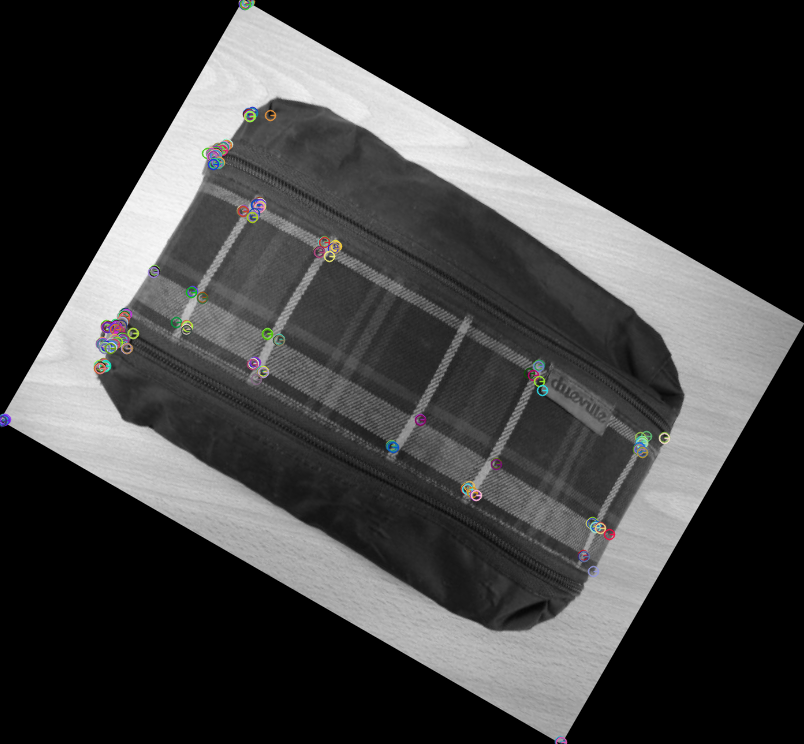

time: 2.31 s (started: 2022-09-22 16:32:57 +00:00)


In [ ]:
img1 = cv2.imread('uch001a.jpg',0)
img2 = do_rotate(img1, 30)

kp1, h1 = harrisDetector(img1, 3e4)
kp2, h2 = harrisDetector(img2, 3e4)

res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print('Resultados de filtro de Harris')
cv2_imshow(h1 * 500 / np.max(np.max(h1)))
cv2_imshow(h2 * 500 / np.max(np.max(h2)))
print('Puntos de interes')
cv2_imshow(res1)
cv2_imshow(res2)

Resultados de filtro de Harris


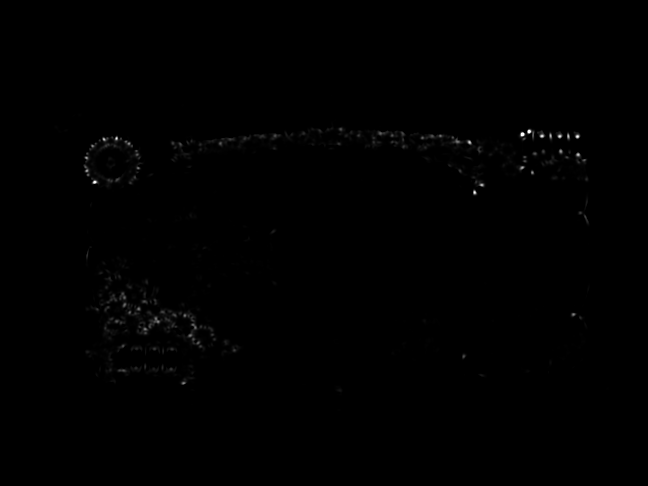

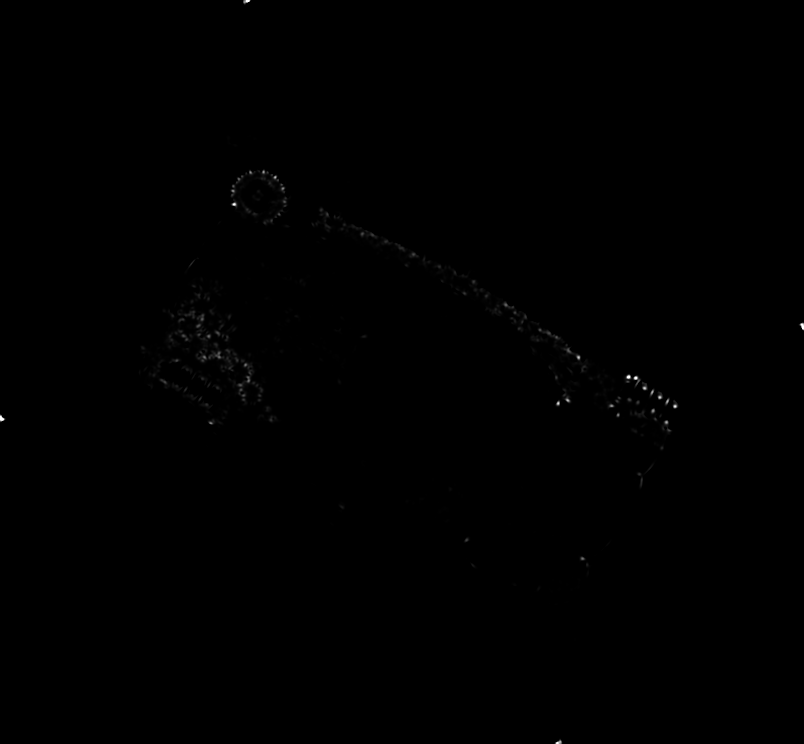

Puntos de interes


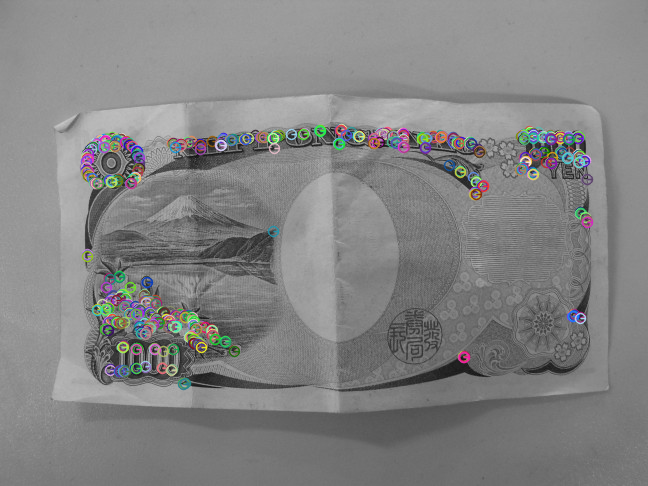

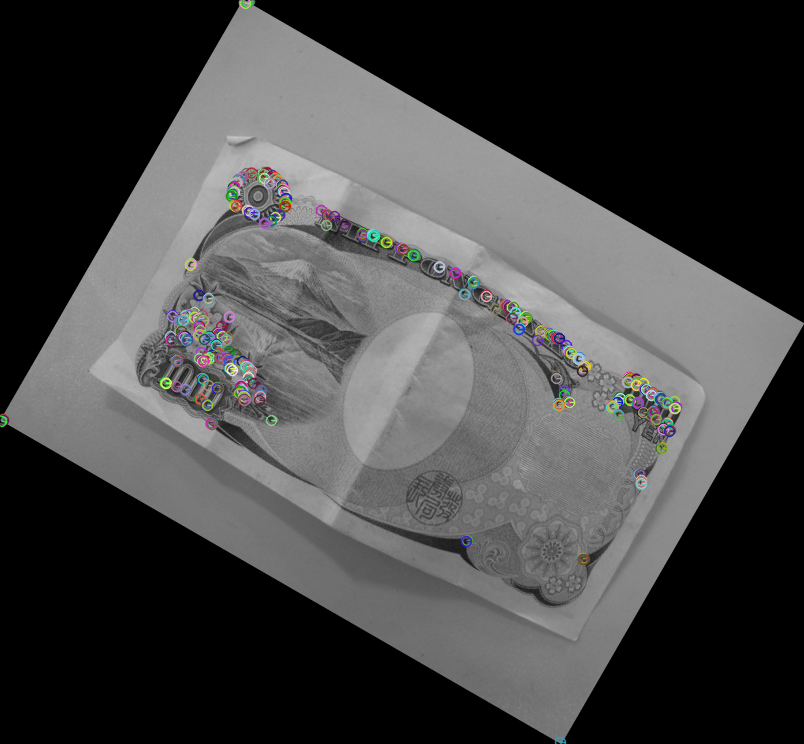

time: 2.37 s (started: 2022-09-22 16:33:00 +00:00)


In [ ]:
img1 = cv2.imread('uch020a.jpg',0)
img2 = do_rotate(img1, 30)

kp1, h1 = harrisDetector(img1, 3e4)
kp2, h2 = harrisDetector(img2, 3e4)

res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print('Resultados de filtro de Harris')
cv2_imshow(h1 * 500 / np.max(np.max(h1)))
cv2_imshow(h2 * 500 / np.max(np.max(h2)))
print('Puntos de interes')
cv2_imshow(res1)
cv2_imshow(res2)

## Parte 2: Reconocimiento de objetos particulares

In [ ]:
import math

def genTransform(match, keypoints1, keypoints2):
  # Calcular transformacion de semejanza (e,theta,tx,ty) a partir de un calce "match".
  # Se debe notar que los keypoints de OpenCV tienen orientacion en grados.

  # se extraen índices de referencia y prueba
  indexref = match.trainIdx
  indexpru = match.queryIdx

  # se definen las posiciones de referencia y prueba a partir de los keypoints
  (xref, yref) = keypoints1[indexref].pt
  (xpru, ypru) = keypoints2[indexpru].pt

  # se define la escala de referencia y prueba
  sigmaref = keypoints1[indexref].size
  sigmapru = keypoints2[indexpru].size

  # se definen los angulos phi para cada uno, se transforma a radianes para usar funciones predefinidas en python (math)
  phiref = (keypoints1[indexref].angle) * math.pi / 180
  phipru = (keypoints2[indexpru].angle) * math.pi / 180

  # se define el factor de escala entre imágenes e
  e = sigmapru / sigmaref

  # se define ángulo theta como la resta entre phi_pru y phi_ref
  theta = phipru - phiref

  # se define la traslación (tx, ty)
  tx = xpru - e * (xref * math.cos(theta) - yref * math.sin(theta))
  ty = ypru - e * (xref * math.sin(theta) + yref * math.cos(theta))

  return (e, theta, tx, ty) # se retorna la transformación de semejanza

time: 3.39 ms (started: 2022-09-22 16:33:02 +00:00)


In [ ]:
def computeConsensus(matches, keypoints1, keypoints2, e, theta, tx, ty, umbralpos):
  # Calcular el número de matches compatibles con la transformación (e, theta, tx, ty) indicada
  # Debe devolver el número de matches compatibles, y una lista con los matches compatibles

  # se define lista que guarda los matches compatibles y un valor que los contará
  compatible_match = []
  number_of_matches = 0

  for match in matches: # se recorren los matches
    indexref = match.trainIdx
    indexpru = match.queryIdx

    (xref, yref) = keypoints1[indexref].pt
    (xpru, ypru) = keypoints2[indexpru].pt

    x_t = tx + e * (xref * math.cos(theta) - yref * math.sin(theta))
    y_t = ty + e * (xref * math.sin(theta) + yref * math.cos(theta))

    # se calcula la distancia euclidiana entre (x_t, y_t) y (xpru, ypru)
    euclidean_dist = math.sqrt((x_t - xpru)**2 + (y_t - ypru)**2) # error de proyección

    # se analiza la distancia con el umbral definido
    if euclidean_dist < umbralpos:
      number_of_matches += 1
      compatible_match.append(match)

  return (number_of_matches, compatible_match)

time: 2.11 ms (started: 2022-09-22 16:50:28 +00:00)


In [193]:
import random
def ransac(matches, keypoints1, keypoints2):
  n_matches = []
  accepted = []
  intentos = 500
  umbral_error = 10
  umbral_consenso = 50

  for i in range(intentos): # se repite el consenso según los intentos definidos

    random_index = random.randint(0, len(matches)-1) # se busca un indice aleatorio para buscar el calce al azar
    match = matches[random_index] # se extrae el calce aleatorio
    (e, theta, tx, ty) = genTransform(match, keypoints1, keypoints2) # se busca transformación de semejanza
  
    (count, calces) = computeConsensus(matches, keypoints1, keypoints2, e, theta, tx, ty, umbral_error) # se realiza el consenso

    if count > umbral_consenso: # se guardan los calces siempre y cuando sean mayores al umbral
      n_matches.append(count)
      accepted.append(calces)
    
  maximum = max(n_matches) # se toma la iteración con mayor número de calces
  index = n_matches.index(maximum)

  return accepted[index]

time: 4.43 ms (started: 2022-09-23 01:55:37 +00:00)


In [194]:
def calcAfin(matches, keypoints1, keypoints2):
  # Por hacer: calcular la transformacion afin mediante minimos cuadrados a partir de "matches"

  # definimos matrices que ayudarán a calcular la transformación
  A = []
  b = []
  for match in matches: # recorremos todos los calces
    indexref = match.trainIdx
    indexpru = match.queryIdx

    (xref, yref) = keypoints1[indexref].pt
    (xpru, ypru) = keypoints2[indexpru].pt

    f1 = [xref, yref, 0, 0, 1, 0]
    f2 = [0, 0, xref, yref, 0, 1]

    A.append(f1)
    A.append(f2)
    b.append(xpru)
    b.append(ypru)

  A = np.array(A)
  A_tr = np.transpose(A)
  b = np.array(b)

  output = np.matmul(np.matmul(np.linalg.inv(np.matmul(A_tr, A)), A_tr), b) # se realiza operación (A^T * A)^-1 * A^T * b (enunciado)

  # reordenamiento
  transformacion = []
  fila1 = [output[0], output[1], output[4]]
  fila2 = [output[2], output[3], output[5]]
  transformacion.append(fila1)
  transformacion.append(fila2)

  transformacion = np.array(transformacion)

  return transformacion

time: 5.43 ms (started: 2022-09-23 01:55:38 +00:00)


In [195]:
# Esta función devuelve la imagen "input1" con un romboide dibujado
# El romboide representa el rectangulo de la imagen "input2" proyectada en la imagen "input1"
# La proyección se realiza a partir de la transformación "transf"

def drawProjAfin(transf, input1, input2):
  w = input2.shape[1];
  h = input2.shape[0];
  sq1 = [0,0]
  sq2 = [w-1,0]
  sq3 = [w-1,h-1]
  sq4 = [0,h-1];
  p1 = [0,0]
  p2 = [0,0]
  p3 = [0,0]
  p4 = [0,0]
  print("Tamano "  + str(transf.shape[1]) + " x " + str(transf.shape[0]));
  print("Posicion " + str(transf[0,2]) + " , " + str(transf[1,2]));
  print("Matriz " + str(transf[0,0]) + " " + str(transf[0,1]) + " " + str(transf[0,2]) + " " + str(transf[1,0]) + " " + str(transf[1,1]) + " " + str(transf[1,2]));

  p1[0] = transf[0,0] * sq1[0] + transf[0,1] * sq1[1] + transf[0,2];
  p1[1] = transf[1,0] * sq1[0] + transf[1,1] * sq1[1] + transf[1,2];
  p2[0] = transf[0,0] * sq2[0] + transf[0,1] * sq2[1] + transf[0,2];
  p2[1] = transf[1,0] * sq2[0] + transf[1,1] * sq2[1] + transf[1,2];
  p3[0] = transf[0,0] * sq3[0] + transf[0,1] * sq3[1] + transf[0,2];
  p3[1] = transf[1,0] * sq3[0] + transf[1,1] * sq3[1] + transf[1,2];
  p4[0] = transf[0,0] * sq4[0] + transf[0,1] * sq4[1] + transf[0,2];
  p4[1] = transf[1,0] * sq4[0] + transf[1,1] * sq4[1] + transf[1,2];

  p1 = (int(p1[0]), int(p1[1]))
  p2 = (int(p2[0]), int(p2[1]))
  p3 = (int(p3[0]), int(p3[1]))
  p4 = (int(p4[0]), int(p4[1]))


  out = np.copy(input1);
  cv2.line(out, p1, p2, (255,255,255));
  cv2.line(out, p2, p3, (255,255,255));
  cv2.line(out, p3, p4, (255,255,255));
  cv2.line(out, p4, p1, (255,255,255));
  return out;

time: 6.49 ms (started: 2022-09-23 01:55:38 +00:00)


In [196]:
# Esta funcion ya esta lista, no debe ser modificada
def filterMatches(matches):
  # Apply ratio test
  points1 = []
  points2 = []
  good = []

  for m,n in matches:
    if m.distance < 0.75*n.distance:  # 0.75
      good.append(m)
      points1.append(kp1[m.queryIdx].pt)
      points2.append(kp2[m.trainIdx].pt)
  return np.array(points1), np.array(points2), good

time: 1.41 ms (started: 2022-09-23 01:55:38 +00:00)


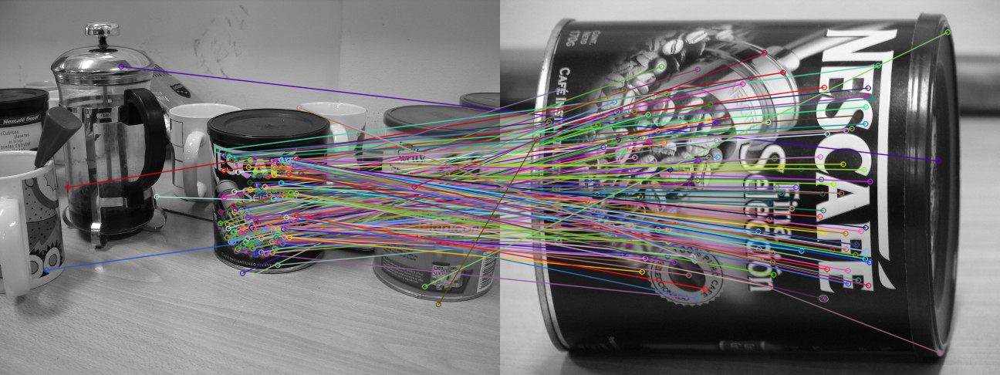

time: 465 ms (started: 2022-09-23 01:55:38 +00:00)


In [197]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

img2 = cv2.imread('uch010a.jpg',0)
img1 = cv2.imread('uch010b.jpg',0)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

#### BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)
points1, points2, good = filterMatches(matches)

img_match = cv2.drawMatches(img1,kp1,img2,kp2,good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_match)


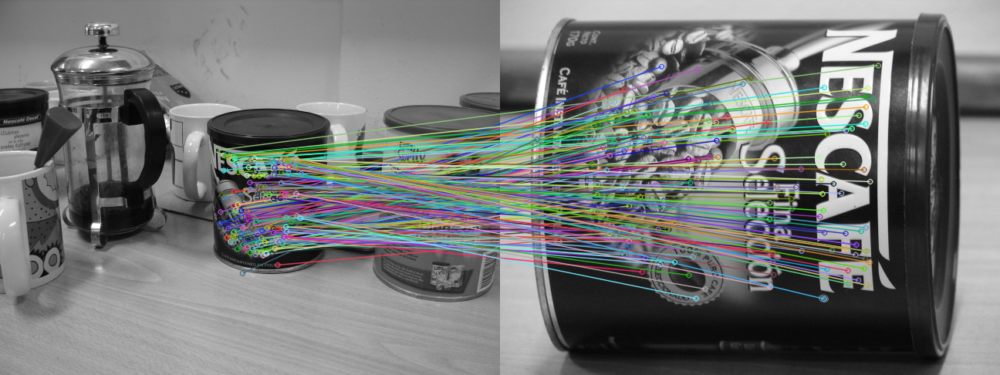

[[-2.48736859e-03  3.56443103e-01  2.49202327e+02]
 [-3.44538545e-01  2.36916660e-02  3.63480430e+02]]
Tamano 3 x 2
Posicion 249.2023265560464 , 363.480429592402
Matriz -0.0024873685916045035 0.3564431026409001 249.2023265560464 -0.3445385451765426 0.023691665959009796 363.480429592402


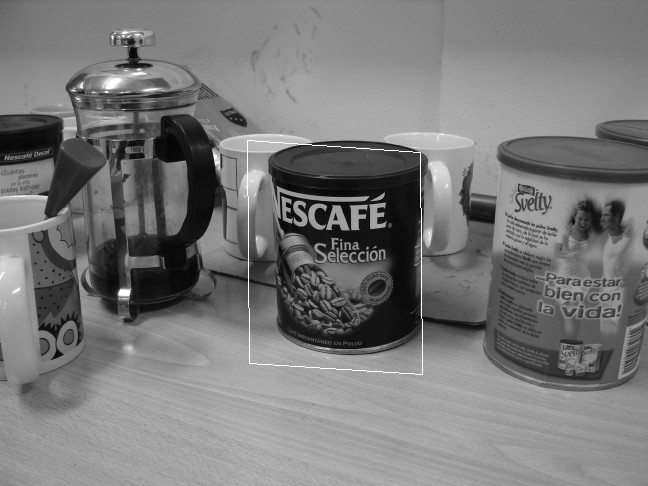

time: 538 ms (started: 2022-09-23 01:55:38 +00:00)


In [198]:
# Por hacer:
# 1) Obtener los calces aceptados a partir de la función ransac(good, kp2, kp1)
Ransac_points = ransac(good, kp2, kp1)
# 2) Dibujar los calces aceptados
calces_img = cv2.drawMatches(img1,kp1,img2,kp2,Ransac_points, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(calces_img)
# 3) Calcular la transformacion afin
transformacion = calcAfin(Ransac_points, kp2, kp1)
# 4) Dibujar la imagen con el romboide superpuesto
print(transformacion) # Para analizar los valores dentro de esta
cv2_imshow(drawProjAfin(transformacion, img1, img2))

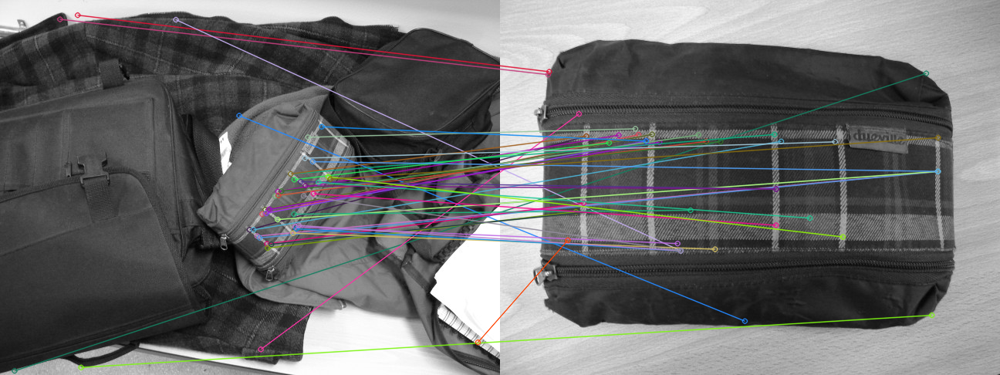

time: 491 ms (started: 2022-09-23 01:55:39 +00:00)


In [199]:
img2 = cv2.imread('uch001a.jpg',0)
img1 = cv2.imread('uch001b.jpg',0)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

#### BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)
points1, points2, good = filterMatches(matches)

img_match = cv2.drawMatches(img1,kp1,img2,kp2,good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_match)

In [200]:
# Por hacer:
# 1) Obtener los calces aceptados a partir de la función ransac(good, kp2, kp1)
Ransac_points = ransac(good, kp2, kp1)
# 2) Dibujar los calces aceptados
calces_img = cv2.drawMatches(img1,kp1,img2,kp2,Ransac_points, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(calces_img)
# 3) Calcular la transformacion afin
transformacion = calcAfin(Ransac_points, kp2, kp1)
# 4) Dibujar la imagen con el romboide superpuesto
print(transformacion)
cv2_imshow(drawProjAfin(transformacion, img1, img2))

ValueError: ignored

time: 95.4 ms (started: 2022-09-23 01:55:40 +00:00)


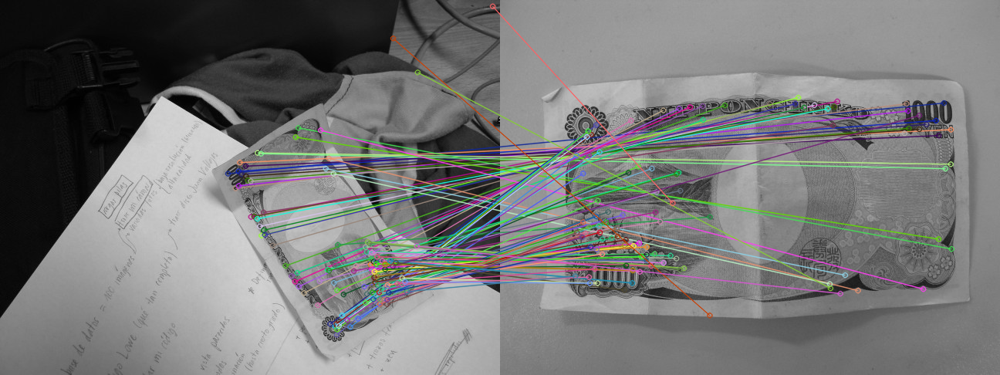

time: 418 ms (started: 2022-09-23 01:55:48 +00:00)


In [201]:
img2 = cv2.imread('uch020a.jpg',0)
img1 = cv2.imread('uch020b.jpg',0)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

#### BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)
points1, points2, good = filterMatches(matches)

img_match = cv2.drawMatches(img1,kp1,img2,kp2,good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_match)

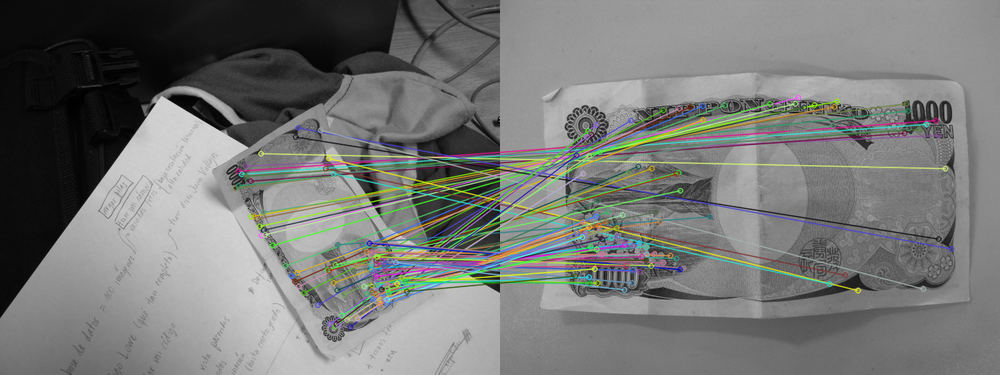

[[-2.70654989e-01  4.53931980e-01  3.87452713e+02]
 [-4.55488184e-01 -2.72161000e-01  5.17635052e+02]]
Tamano 3 x 2
Posicion 387.4527133929941 , 517.635052127165
Matriz -0.2706549888088818 0.4539319799663332 387.4527133929941 -0.4554881837324344 -0.27216099952382705 517.635052127165


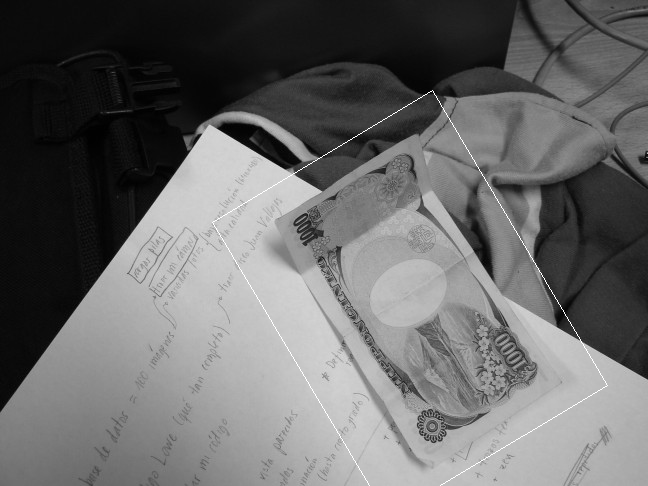

time: 503 ms (started: 2022-09-23 01:55:49 +00:00)


In [202]:
# Por hacer:
# 1) Obtener los calces aceptados a partir de la función ransac(good, kp2, kp1)
Ransac_points = ransac(good, kp2, kp1)
# 2) Dibujar los calces aceptados
calces_img = cv2.drawMatches(img1,kp1,img2,kp2,Ransac_points, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(calces_img)
# 3) Calcular la transformacion afin
transformacion = calcAfin(Ransac_points, kp2, kp1)
# 4) Dibujar la imagen con el romboide superpuesto
print(transformacion)
cv2_imshow(drawProjAfin(transformacion, img1, img2))

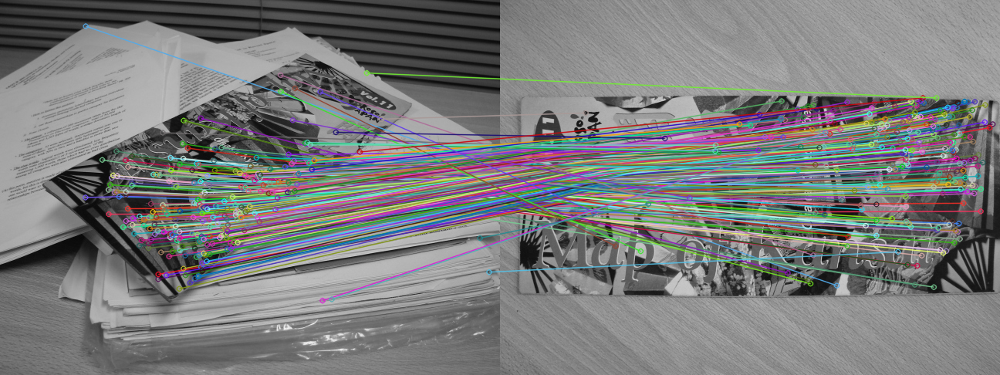

time: 657 ms (started: 2022-09-23 01:55:49 +00:00)


In [203]:
img2 = cv2.imread('uch098a.jpg',0)
img1 = cv2.imread('uch098b.jpg',0)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

#### BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)
points1, points2, good = filterMatches(matches)

img_match = cv2.drawMatches(img1,kp1,img2,kp2,good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_match)

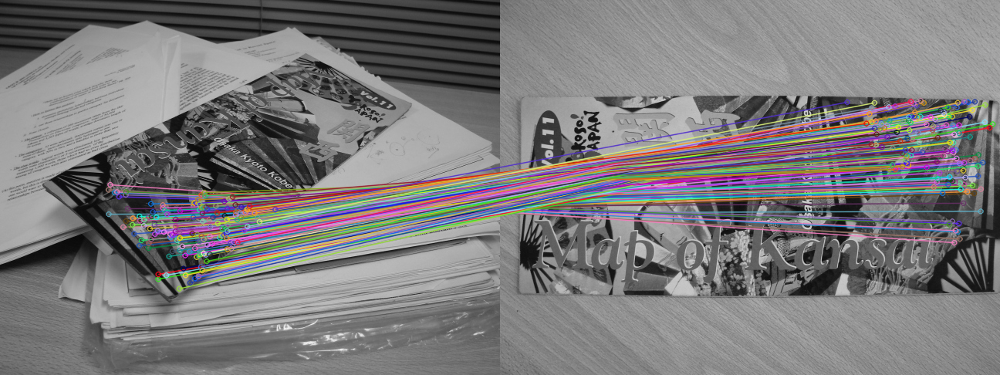

[[-7.12237700e-01 -6.83865166e-01  7.73521048e+02]
 [ 5.59115421e-01 -6.10685000e-01  9.71543618e+01]]
Tamano 3 x 2
Posicion 773.5210476782019 , 97.15436177554798
Matriz -0.712237700351669 -0.6838651664853501 773.5210476782019 0.5591154209742496 -0.6106850003931614 97.15436177554798


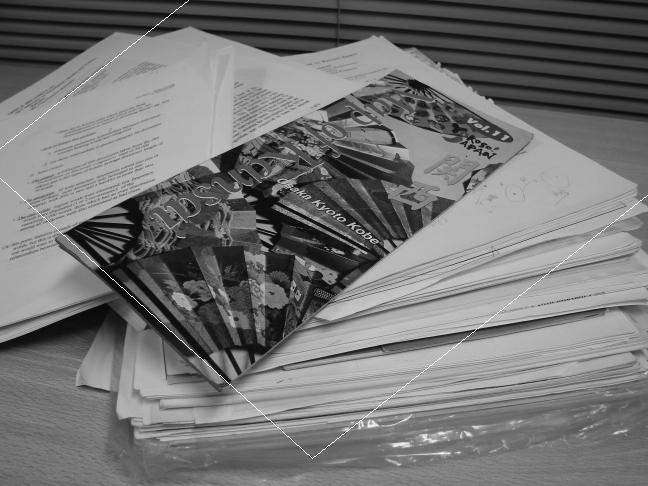

time: 717 ms (started: 2022-09-23 01:55:50 +00:00)


In [204]:
# Por hacer:
# 1) Obtener los calces aceptados a partir de la función ransac(good, kp2, kp1)
Ransac_points = ransac(good, kp2, kp1)
# 2) Dibujar los calces aceptados
calces_img = cv2.drawMatches(img1,kp1,img2,kp2,Ransac_points, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(calces_img)
# 3) Calcular la transformacion afin
transformacion = calcAfin(Ransac_points, kp2, kp1)
# 4) Dibujar la imagen con el romboide superpuesto
print(transformacion)
cv2_imshow(drawProjAfin(transformacion, img1, img2))